<a href="https://colab.research.google.com/github/Manos-Mak120/-/blob/Wordclouds/TRUMP(25)_WORDCLOUDS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

import time
import random

from tqdm import tqdm

In [ ]:
def get_webpage_soup(url):
  headers = {
        "User-Agent": "Mozilla/5.0"
    }
  response = requests.get(url, headers=headers)
  if response.status_code != 200:
    return None
  else:
    return BeautifulSoup(response.text, 'html.parser')

In [ ]:
def get_article_elements_from_soup(soup, article_url):
    # title
    try:
        title = soup.find("h1").text.strip()
    except:
        title = ""

    # datetime
    try:
        datetime_str = soup.find("time")["datetime"]
        date_str = datetime_str.split("T")[0]
        time_str = datetime_str.split("T")[1].split("+")[0]
    except:
        date_str = ""
        time_str = ""

    # section
    try:
        section_div = soup.find("div", class_="main-category-block") or soup.find("div", class_="main-category")
        section = section_div.text.strip() if section_div else ""
    except:
        section = ""

    # author
    try:
      author_tag = soup.find("a", class_="author-name") or soup.find("span", class_="author-name")
      author = author_tag.text.strip() if author_tag else ""
    except:
        author = ""
    # excerpt
    try:
        excerpt_div = soup.find("div", class_="p.main-intro") or soup.find(itemprop="description") or soup.find("div", class_="nx-excerpt")
        excerpt = excerpt_div.text.strip() if excerpt_div else ""
    except:
        excerpt = ""

    # text body
    try:
      content_div = soup.find("div", class_="main-text story-fulltext")
      elements = content_div.find_all(["p", "h2", "h3", "ul", "ol", "li"]) if content_div else []
      text_body = " ".join(el.get_text(strip=True) for el in elements if el.get_text(strip=True))
    except:
        text_body = ""

    # feature image
    try:
        img_block = soup.find("div", class_="article-image") or soup.find("figure")
        feat_img_link = img_block.find("img")["src"] if img_block and img_block.find("img") else ""
    except:
        feat_img_link = ""

    # image caption
    try:
        caption_div = soup.find("div", class_="image-caption") or soup.find("figcaption")
        image_caption = caption_div.text.strip() if caption_div else ""
    except:
        image_caption = ""

    articleD = {
        "article_url": article_url,
        "title": title,
        "date": date_str,
        "time": time_str,
        "section": section,
        "author": author,
        "excerpt": excerpt,
        "text_body": text_body,
        "feat_img_link": feat_img_link,
        "feat_img_cation": image_caption
    }

    return articleD

In [ ]:
def scrape_newsbomb_articles_pages(trump_df_2025):
  all_articles_dataL = []
  base_url = "newbomb"
  for idx, row in tqdm(trump_df_2025.iterrows(), total=trump_df_2025.shape[0], desc="Processing rows"):
    article_url_relative = row['article_url']
    article_url = base_url + article_url_relative
    soup = get_webpage_soup(article_url)
    if soup:
     articleD = get_article_elements_from_soup(soup, article_url)
     all_articles_dataL.append(articleD)
     delay = random.uniform(1, 3)
     time.sleep(delay)
  df = pd.DataFrame(all_articles_dataL)
  print(f"\nScraping completed. Fetshed {len(df)} articles.")
  return df

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
trump_teasers_df = pd.read_csv("/content/drive/MyDrive/Εργασία Python/scrappers/TRUMP(24)-SCRAPER.CSV")
trump_teasers_df.head()

,title,article_url,date,time,section,excerpt
0,Το νέο Air Force One του Τραμπ: Θα παραλάβει «...,https://www.newsbomb.gr/kosmos/story/1648636/t...,12.05.2025,07:56,ΚΟΣΜΟΣ,Ο Τραμπ πρόκειται να λάβει ένα «ιπτάμενο παλάτ...
1,Τραμπ: Προανήγγειλε εκτελεστικό διάταγμα για τ...,https://www.newsbomb.gr/kosmos/story/1648622/t...,12.05.2025,03:29,ΚΟΣΜΟΣ,Σκοπός να μειωθούν οι τιμές των συνταγογραφούμ...
2,Τραμπ: Μνημειώδης είδηση η συμφωνία απελευθέρω...,https://www.newsbomb.gr/kosmos/story/1648621/t...,12.05.2025,03:00,ΚΟΣΜΟΣ,«Είμαι ευγνώμων σε όλους όσοι συνέβαλαν να έρθ...
3,Ραντεβού στην Τουρκία δίνει ο Ζελένσκι - Θα πε...,https://www.newsbomb.gr/kosmos/story/1648569/r...,11.05.2025,20:22,ΚΟΣΜΟΣ,Η απάντηση ήρθε μετά τις αμερικανικές πιέσεις ...
4,Τραμπ: «Η Ουκρανία να συμφωνήσει άμεσα στην πρ...,https://www.newsbomb.gr/kosmos/story/1648556/t...,11.05.2025,19:31,ΚΟΣΜΟΣ,Νέα παρέμβαση του Αμερικανού προέδρου καθώς το...


In [ ]:
trump_teasers_df.dtypes

,0
title,object
article_url,object
date,object
time,object
section,object
excerpt,object


In [ ]:
trump_teasers_df['date'] = pd.to_datetime(trump_teasers_df['date'], format='%d.%m.%Y')
trump_teasers_df.dtypes

,0
title,object
article_url,object
date,datetime64[ns]
time,object
section,object
excerpt,object


In [ ]:
trump_teasers_df['title'] = trump_teasers_df['title'].astype(str).fillna('')
trump_teasers_df['excerpt'] = trump_teasers_df['excerpt'].astype(str).fillna('')

trump_teasers_df["text"] = trump_teasers_df[['title', 'excerpt']].agg('. '.join, axis=1)
trump_teasers_df.loc[0, 'text']

'Το νέο Air Force One του Τραμπ: Θα παραλάβει «ιπτάμενο παλάτι» 400 εκατομμυρίων δολαρίων από το Κατάρ - Φουντώνουν οι επικρίσεις. Ο Τραμπ πρόκειται να λάβει ένα «ιπτάμενο παλάτι» αξίας 400 εκατομμυρίων δολαρίων από το Κατάρ για να το χρησιμοποιήσει ως…'

In [ ]:
short_df = trump_teasers_df[['date', 'text']]
short_df.head()

,date,text
0,2025-05-12,Το νέο Air Force One του Τραμπ: Θα παραλάβει «...
1,2025-05-12,Τραμπ: Προανήγγειλε εκτελεστικό διάταγμα για τ...
2,2025-05-12,Τραμπ: Μνημειώδης είδηση η συμφωνία απελευθέρω...
3,2025-05-11,Ραντεβού στην Τουρκία δίνει ο Ζελένσκι - Θα πε...
4,2025-05-11,Τραμπ: «Η Ουκρανία να συμφωνήσει άμεσα στην πρ...


In [ ]:
trump_teasers_df['year'] = pd.DatetimeIndex(trump_teasers_df['date']).year
trump_teasers_df['month'] = pd.DatetimeIndex(trump_teasers_df['date']).month
trump_teasers_df['day'] = pd.DatetimeIndex(trump_teasers_df['date']).day


short_df = trump_teasers_df[['date', 'text', 'year', 'month', 'day']]
short_df.head()

trump_nov_jan_teasers = trump_teasers_df[
    (trump_teasers_df['month'] == 11) |
    (trump_teasers_df['month'] == 12) |
    (trump_teasers_df['month'] == 1) |  # Added '|'
    (trump_teasers_df['month'] == 2) |  # Added '|'
    (trump_teasers_df['month'] == 3) |  # Added '|'
    (trump_teasers_df['month'] == 4)
]
trump_nov_jan_teasers

,title,article_url,date,time,section,excerpt,text,year,month,day
91,Ουκρανία: «Σχέδιο Β» της Ευρώπης εάν ο Τραμπ ε...,https://www.newsbomb.gr/kosmos/story/1645898/s...,2025-04-30,22:43,ΚΟΣΜΟΣ,"«Υπάρχουν εργαλεία στα χέρια των Αμερικανών, π...",Ουκρανία: «Σχέδιο Β» της Ευρώπης εάν ο Τραμπ ε...,2025,4,30
92,Τραμπ: Είμαστε έτοιμοι να υπογράψουμε και σήμε...,https://www.newsbomb.gr/kosmos/story/1645874/t...,2025-04-30,21:06,ΚΟΣΜΟΣ,Ο πρόεδρος των Ηνωμένων Πολιτειών Ντόναλντ Τρα...,Τραμπ: Είμαστε έτοιμοι να υπογράψουμε και σήμε...,2025,4,30
93,Τραμπ: «Η Κίνα τα πάει πολύ άσχημα αυτή τη στι...,https://www.newsbomb.gr/kosmos/story/1645864/t...,2025-04-30,20:18,ΚΟΣΜΟΣ,Έκθεση δείχνει συρρίκνωση της κινεζικής εργοστ...,Τραμπ: «Η Κίνα τα πάει πολύ άσχημα αυτή τη στι...,2025,4,30
94,ΗΠΑ: Κινδυνεύει με απέλαση η Αμάλ Κλούνεΐ - Ο ...,https://www.newsbomb.gr/kosmos/story/1645860/i...,2025-04-30,20:05,ΚΟΣΜΟΣ,Πιθανή απαγόρευση εισόδου στις ΗΠΑ για τη γνωσ...,ΗΠΑ: Κινδυνεύει με απέλαση η Αμάλ Κλούνεΐ - Ο ...,2025,4,30
95,Συμφωνία ΗΠΑ-Ουκρανίας: Εμπόδια της τελευταίας...,https://www.newsbomb.gr/kosmos/story/1645828/s...,2025-04-30,17:52,ΚΟΣΜΟΣ,Αιφνίδιες διαφωνίες καθυστερούν την υπογραφή κ...,Συμφωνία ΗΠΑ-Ουκρανίας: Εμπόδια της τελευταίας...,2025,4,30
...,...,...,...,...,...,...,...,...,...,...
2514,"Τραμπ: «Αν η Ευρώπη δεχτεί επίθεση, οι ΗΠΑ δεν...",https://www.newsbomb.gr/kosmos/story/1509543/t...,2024-01-11,08:09,ΚΟΣΜΟΣ,Ο Ντόναλντ Τραμπ είχε πει το 2020 στους Ευρωπα...,"Τραμπ: «Αν η Ευρώπη δεχτεί επίθεση, οι ΗΠΑ δεν...",2024,1,11
2515,Ντόναλτ Τραμπ: Μεγάλο προβάδισμα για το χρίσμα...,https://www.newsbomb.gr/kosmos/story/1509454/d...,2024-01-10,20:33,ΚΟΣΜΟΣ,Ο πρώην πρόεδρος των ΗΠΑ είναι ο προτιμώμενος ...,Ντόναλτ Τραμπ: Μεγάλο προβάδισμα για το χρίσμα...,2024,1,10
2516,ΗΠΑ: Απεβίωσε η μητέρα της Μελάνια Τραμπ σε ηλ...,https://www.newsbomb.gr/kosmos/story/1509430/i...,2024-01-10,18:59,ΚΟΣΜΟΣ,"Η Αμαλία Κναβς, σλοβενικής υπηκοότητας, εγκατα...",ΗΠΑ: Απεβίωσε η μητέρα της Μελάνια Τραμπ σε ηλ...,2024,1,10
2517,Μελάνια Τραμπ: Πέθανε η μητέρα της σε ηλικία 7...,https://www.newsbomb.gr/kosmos/story/1509191/m...,2024-01-10,07:35,ΚΟΣΜΟΣ,"Η Aμαλία Κναβς, μητέρα της Mελάνια Τραμπ, πέθα...",Μελάνια Τραμπ: Πέθανε η μητέρα της σε ηλικία 7...,2024,1,10


In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

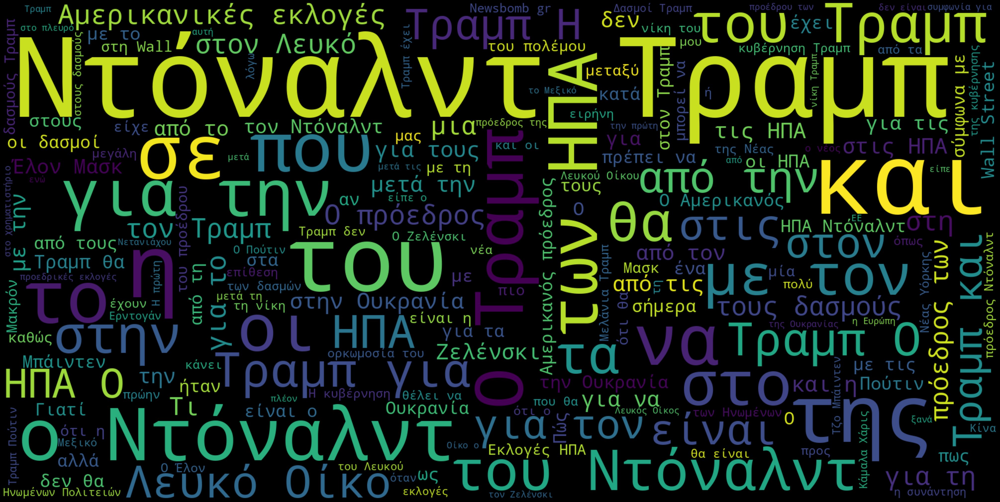

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# Concatenate all text entries from the 'text' column into a single string
all_text = " ".join(trump_nov_jan_teasers['text'].tolist())

wordcloud = WordCloud(  #ενώνει όλα τα κείμενα μαζί για να μας φέρει το wordcloud
    stopwords = STOPWORDS, # <- τα stopwords που θέλουμε να κοπούν
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(all_text) # <- μέσα στην παρένθεση βάζουμε το όνομα της μεταβλητής του κειμένου
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
list(STOPWORDS)[0:20]

["when's",
 'nor',
 'because',
 'by',
 'else',
 'with',
 'above',
 'up',
 'at',
 "what's",
 'down',
 'same',
 'myself',
 'this',
 'through',
 'himself',
 'while',
 "mustn't",
 'any',
 'had']

In [ ]:
import spacy

In [ ]:
!python -m spacy download el_core_news_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 70.7 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
nlp = spacy.load('el_core_news_sm')

In [ ]:
print(sorted(nlp.Defaults.stop_words)[0:20])

['άλλα', 'άλλες', 'άλλη', 'άλλην', 'άλλης', 'άλλο', 'άλλοι', 'άλλον', 'άλλος', 'άλλοτε', 'άλλους', 'άλλων', 'άμα', 'άμεσα', 'άνευ', 'άνω', 'άξαφνα', 'άρα', 'άραγε', 'έγιναν']


In [ ]:
def create_wordcloud(text):
  wordcloud = WordCloud(
      stopwords = nlp.Defaults.stop_words,
      width = 2000,
      height = 1000,
      background_color = 'black'
  ).generate(text)
  return wordcloud

Φτιάχνω ξεχωριστό function για το wordcloud γιατί μπορεί να θέλω να δω κάτι στο wordcloud και όχι απαραίτητα να το κάνω εικόνα.

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import spacy # Import spacy if not already imported in this block
import re # Import re if not already imported in this block

all_text_trump_nov_jan = " ".join(trump_nov_jan_teasers['text'].tolist())


wcloud = create_wordcloud(all_text_trump_nov_jan)

list(wcloud.words_.items())[:5]

[('Τραμπ', 1.0),
 ('Ντόναλντ Τραμπ', 0.7489779231398201),
 ('ΗΠΑ', 0.6941946034341783),
 ('Ουκρανία', 0.16925592804578904),
 ('δασμούς', 0.1267375306623058)]

In [ ]:
def create_wordcloud_img(text):
  wordcloud = create_wordcloud(text)
  fig = plt.figure(
      figsize = (40, 30),
      facecolor = 'k',
      edgecolor = 'k')
  return plt.imshow(wordcloud)

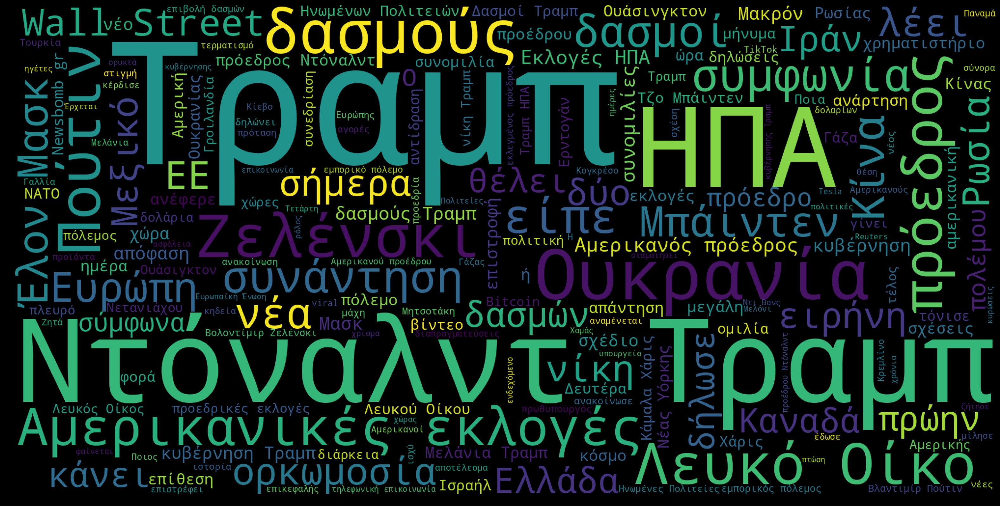

In [ ]:
all_text_trump_nov_jan = " ".join(trump_nov_jan_teasers['text'].tolist())

create_wordcloud_img(all_text_trump_nov_jan)

In [ ]:
custom_stopwords = {'εκλογές',"Ντόναλντ" 'Τράμπ'}

for word in custom_stopwords:
   if word not in nlp.Defaults.stop_words:
     nlp.Defaults.stop_words.add(word)
     lex_attr = nlp.vocab[word]
     lex_attr.is_stop = True

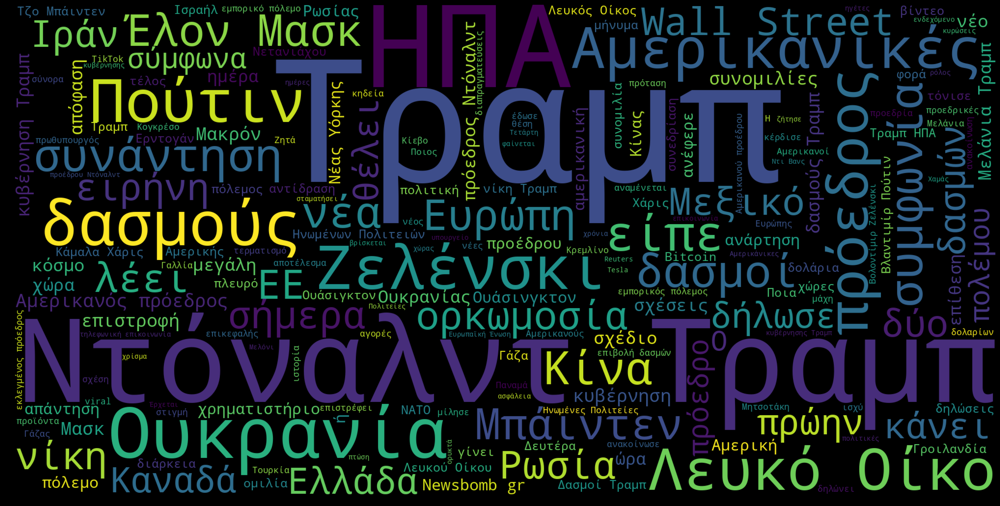

In [ ]:
create_wordcloud_img(all_text_trump_nov_jan)

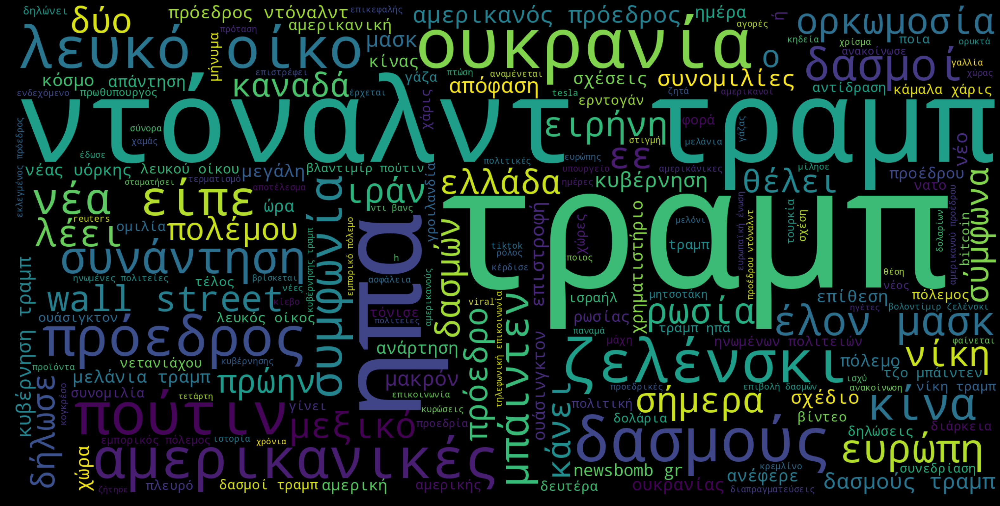

In [ ]:
jan_text_lower_series = trump_nov_jan_teasers['text'].str.lower()

jan_text_lower = " ".join(jan_text_lower_series.tolist())

create_wordcloud_img(jan_text_lower)

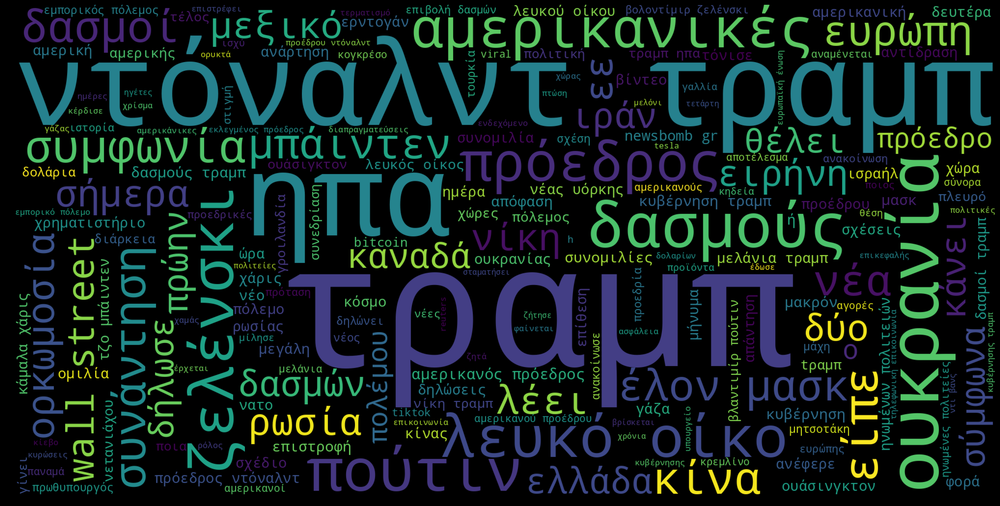

In [ ]:
jan_text_lower = jan_text_lower.replace("ορκομωσία", "ορκομωσίας")
create_wordcloud_img(jan_text_lower)

In [ ]:
jan_doc = nlp(jan_text_lower)

for token in jan_doc[:10]:
    print(f"{token.text} -> {token.lemma_} ({token.pos_})")

ουκρανία -> ουκρανία (NOUN)
: -> : (PUNCT)
« -> « (PUNCT)
σχέδιο -> σχέδιο (NOUN)
β -> β (ADP)
» -> » (PUNCT)
της -> ο (DET)
ευρώπης -> Ευρώπη (PROPN)
εάν -> αν (SCONJ)
ο -> ο (DET)


In [ ]:
tokenized_jan_doc = ' '.join(token.lemma_ for token in jan_doc)

In [ ]:
print(jan_text_lower[:200])
print(tokenized_jan_doc[:200])

ουκρανία: «σχέδιο β» της ευρώπης εάν ο τραμπ εγκαταλείψει τις διαπραγματεύσεις για τον τερματισμό του πολέμου. «υπάρχουν εργαλεία στα χέρια των αμερικανών, που μπορούν να χρησιμοποιήσουν ώστε να ασκήσ
ουκρανία : « σχέδιο β » ο Ευρώπη αν ο τραμπ εγκαταλείπω ο διαπραγματεύσεις για ο τερματισμός ο πόλεμος . « υπάρχω εργαλείο σε ο χέρι ο Αμερικανός , που μπορώ να χρησιμοποιώ ώστε να ασκώ πίεση σε ο Ρωσ


In [ ]:
create_wordcloud_img(tokenized_jan_doc)

In [ ]:
nlp.Defaults.stop_words.add("ορκωμοσίας,ουκρανίας")
create_wordcloud_img(tokenized_jan_doc)

In [ ]:
wordcloud = create_wordcloud(tokenized_jan_doc)
frequencies = wordcloud.words_
print(frequencies)

In [ ]:
wc_df = pd.DataFrame(frequencies.items(), columns=["λέξη", "σχετική συχνότητα"])
wc_df

In [ ]:
jan_doc.ents

In [ ]:
for ent in jan_doc.ents:
  print(ent.text, ent.label_)